# Bank Marketing

Arquivos:
    * bank. csv: uma versão reduzida do conjunto de dados;
    * bank-full.csv: o conjunto completo;
    * bank-names.txt: com a descrição dos campos do conjunto de dados.
    
Para a resolução deste teste utilize o arquivo bank-full.csv e para uma descrição sobre o dataset use bank-names.txt e/ou a fonte oficial


O objetivo da classificação é prever se o cliente assinará um depósito a prazo (variável y).


1. Qual profissão tem mais tendência a fazer um empréstimo? De qual tipo?


2. Fazendo uma relação entre número de contatos e sucesso da campanha quais são os pontos relevantes a serem observados?


3. Baseando-se nos resultados de adesão desta campanha qual o número médio e relevantes o máximo de ligações que você indica para otimizar a adesão?


4. O resultado da campanha anterior tem relevância na campanha atual?


5. Qual o fator determinante para que o banco exija um seguro de crédito?


6. Quais são as características mais proeminentes de um cliente que possua empréstimo imobiliário?

Importando as bibliotecas iniciais para análise e visualização de dados

In [201]:
#Data Analisys
import pandas as pd
import numpy as np

#Data Viz
import matplotlib.pyplot as plt
import seaborn as sns

from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

init_notebook_mode(connected=True)
%matplotlib inline

## Atributos

### Variáveis de Entrada

#### Informações do Cliente

1 - age: idade do cliente

2 - job : tipo do trabalho

3 - marital : estado civil

4 - education: Formação 

5 - default: tem crédito por padrão?

6 - balance: saldo médio anual, em Euros 

7 - housing: tem empréstimo habitacional?

8 - loan: tem empréstimo pessoal?

   
#### Relacionados ao último contato da campanha atual:

9 - contact: tipo de comunicação de contato

10 - day: último dia do mês do contato

11 - month: mês do último contato do ano

12 - duration: duração do último contato, em segundos


#### Outros atributos
  
13 - campaign: número de contatos realizados durante esta campanha e para este cliente 

14 - pdays: número de dias que passaram após o último contato do cliente de uma campanha anterior (-1 significa que o cliente não foi contatado anteriormente)

15 - previous: número de contatos realizados antes desta campanha e para este cliente

16 - poutcome: resultado da campanha de marketing anterior


### Variável de Saída


17 - y - o cliente assinou um depósito a prazo? 


## Datasets

Lendo os datasets citados acima

In [202]:
bank_full =  pd.read_csv('bank-full.csv', sep=';')

In [203]:
bank = pd.read_csv('bank.csv', sep =';')

In [204]:
print("Base: bank-full.csv\n")
print("Linhas = ", bank_full.shape[0])
print("Colunas = ", bank_full.shape[1])

print("\n\nBase: bank.csv\n")
print("Linhas = ", bank.shape[0])
print("Colunas = ", bank.shape[1])

Base: bank-full.csv

Linhas =  45211
Colunas =  17


Base: bank.csv

Linhas =  4521
Colunas =  17


Com o método describe, podemos obter algumas métricas estatisticas sobre nossas colunas númericas

* count =  quantidade de registros
* mean  = média dos valores
* std =  desvio padrão
* min = valor mínimo encontrado
* 25% = valor em 1/4, baseado no max e min
* 50% = valor em 2/4, baseado no max e min
* 75% = valor em 3/4, baseado no max e min
* max = valor máximo encontrado

In [205]:
bank.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,30,unemployed,married,primary,no,1787,no,no,cellular,19,oct,79,1,-1,0,unknown,no
1,33,services,married,secondary,no,4789,yes,yes,cellular,11,may,220,1,339,4,failure,no
2,35,management,single,tertiary,no,1350,yes,no,cellular,16,apr,185,1,330,1,failure,no
3,30,management,married,tertiary,no,1476,yes,yes,unknown,3,jun,199,4,-1,0,unknown,no
4,59,blue-collar,married,secondary,no,0,yes,no,unknown,5,may,226,1,-1,0,unknown,no


In [206]:
bank.describe()

,age,balance,day,duration,campaign,pdays,previous
count,4521.000000,4521.000000,4521.000000,4521.000000,4521.000000,4521.000000,4521.000000
mean,41.170095,1422.657819,15.915284,263.961292,2.793630,39.766645,0.542579
std,10.576211,3009.638142,8.247667,259.856633,3.109807,100.121124,1.693562
min,19.000000,-3313.000000,1.000000,4.000000,1.000000,-1.000000,0.000000
25%,33.000000,69.000000,9.000000,104.000000,1.000000,-1.000000,0.000000
50%,39.000000,444.000000,16.000000,185.000000,2.000000,-1.000000,0.000000
75%,49.000000,1480.000000,21.000000,329.000000,3.000000,-1.000000,0.000000
max,87.000000,71188.000000,31.000000,3025.000000,50.000000,871.000000,25.000000


Obtendo iformações sobre as colunas do dataframe

Nome | Quantidade de registros | Tipo de dado da coluna

In [207]:
bank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4521 entries, 0 to 4520
Data columns (total 17 columns):
age          4521 non-null int64
job          4521 non-null object
marital      4521 non-null object
education    4521 non-null object
default      4521 non-null object
balance      4521 non-null int64
housing      4521 non-null object
loan         4521 non-null object
contact      4521 non-null object
day          4521 non-null int64
month        4521 non-null object
duration     4521 non-null int64
campaign     4521 non-null int64
pdays        4521 non-null int64
previous     4521 non-null int64
poutcome     4521 non-null object
y            4521 non-null object
dtypes: int64(7), object(10)
memory usage: 600.6+ KB


Uma alternativa ao método describe, é a utilização do relatório automatizado da biblioteca **pandas profiling**, no qual fornece mais informações sobre o dataset, como métricas estatísticas, valores faltantes,warnings, histogramas para valores numéricos, counts para variáveis qualitativas, etc

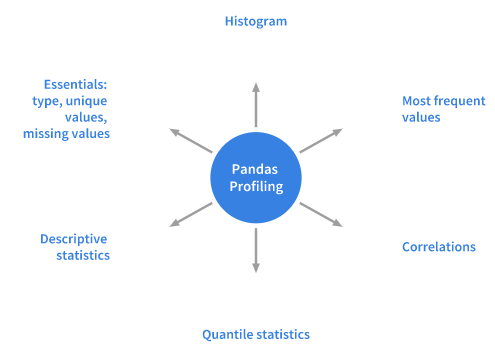

In [208]:
import pandas_profiling

bank.profile_report(style={'full_width':True})

## EDA - Exploratory Data Analysis

Respondendo as perguntas citadas no início

### 1. Qual profissão tem mais tendência a fazer um empréstimo? De qual tipo?

Realizando a contagem de profissões que **realizaram empréstimo**

In [209]:
job_yes = bank_full.loc[bank_full['y']=='yes']['job'].value_counts()

job_yes

management       1301
technician        840
blue-collar       708
admin.            631
retired           516
services          369
student           269
unemployed        202
self-employed     187
entrepreneur      123
housemaid         109
unknown            34
Name: job, dtype: int64

Realizando a contagem de profissões que **não realizaram empréstimo**

In [210]:
job_no = bank_full.loc[bank_full['y']=='no']['job'].value_counts()

job_no

blue-collar      9024
management       8157
technician       6757
admin.           4540
services         3785
retired          1748
self-employed    1392
entrepreneur     1364
housemaid        1131
unemployed       1101
student           669
unknown           254
Name: job, dtype: int64

Realizando a contagem de todas as profissões

In [211]:
total_jobs =  bank_full['job'].value_counts()

total_jobs

blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64

Criando um DataFrame para organizar todas as informções

In [212]:
jobs =  pd.DataFrame(data = {'Job': total_jobs, 'Yes': job_yes, 'No': job_no})

jobs.rename(columns={'Job':'Total'}, inplace=True)

jobs = jobs.sort_values(by='Yes', ascending = False)

Criando **novos** campos:

* Total = Total de respostas baseado na profissão em questão

* % Yes = Porcentagem de emprestimos realizados baseado na profissão em questão

* % No = Porcentagem de emprestimos não realizados baseado na profissão em questão

* % Total_Yes = Porcentagem de emprestimos realizados baseado na profissão em questão em relação com todos os registros

* % Total_No = Porcentagem de emprestimos não realizados baseado na profissão em questão em relação com todos os registros

In [213]:
jobs['% Yes'] =  jobs['Yes'] / jobs['Total'] * 100

jobs['% No'] =  jobs['No'] / jobs['Total'] * 100

jobs['% Total_Yes'] =  jobs['Yes'] / jobs['Total'].sum() *100

jobs['% Total_No'] =  jobs['No'] / jobs['Total'].sum() *100

jobs

,Total,Yes,No,% Yes,% No,% Total_Yes,% Total_No
management,9458,1301,8157,13.755551,86.244449,2.877618,18.042069
technician,7597,840,6757,11.056996,88.943004,1.857955,14.945478
blue-collar,9732,708,9024,7.274969,92.725031,1.565991,19.959744
admin.,5171,631,4540,12.202669,87.797331,1.395678,10.041804
retired,2264,516,1748,22.791519,77.208481,1.141315,3.866316
services,4154,369,3785,8.883004,91.116996,0.816173,8.371856
student,938,269,669,28.678038,71.321962,0.594988,1.479728
unemployed,1303,202,1101,15.502686,84.497314,0.446794,2.435248
self-employed,1579,187,1392,11.842939,88.157061,0.413616,3.078897
entrepreneur,1487,123,1364,8.271688,91.728312,0.272058,3.016965


Criando gráficos para melhor visualização dos dados

In [214]:
from plotly import graph_objs as go

fig = go.Figure()
fig.add_trace(go.Bar(
    y=jobs.index,
    x=jobs['% Yes'],
    name='Yes',
    orientation='h',
    marker=dict(
        color='rgba(0, 255, 93, 0.6)',
        line=dict(color='rgba(0, 255, 93, 1.0)', width=3)
    )
))
fig.add_trace(go.Bar(
    y=jobs.index,
    x=jobs['% No'],
    name='No',
    orientation='h',
    marker=dict(
        color='rgba(227, 23, 32, 0.6)',
        line=dict(color='rgba(227, 23, 32, 1.0)', width=3)
    )
))

fig.layout.update(barmode ='stack', title_text="% de Aprovação / Reprovação de Emprestimos em cada Profissão")
fig.show()

In [215]:
labels = jobs.index
values = jobs['% Total_Yes']

fig = go.Figure(data=[go.Pie(labels=labels, values=values)])
fig.layout.update(title_text="% Emprestimos aprovados por profissão")
fig.show()

### Resposta Q1

Baseado nos gráficos acima, podemos observar que as seguintes profissões que realizam mais emprestimos são:

**TOP 5 :**

    1. management
    2. technician
    3. blue-collar
    4. admin
    5. retired   

Outra curiosidade é que, analisando por profissão, quais aceitam mais propostas de emprestimo são:

**TOP 3:**

    1. student
    2. retired
    3. unemployed


### 2. Fazendo uma relação entre número de contatos e sucesso da campanha quais são os pontos relevantes a serem observados?

In [216]:
yes_camp = bank_full.loc[bank_full['y']=='yes']['campaign']
no_camp = bank_full.loc[bank_full['y']=='no']['campaign']

fig = go.Figure()
fig.add_trace(go.Histogram(x=yes_camp, name = 'Yes'))
fig.add_trace(go.Histogram(x= no_camp, name = 'No'))


fig.layout.update(barmode='stack', title_text="Histograma de Ligações segmentado pelo status do emprestimo")
fig.show()

### Outliers

Conforme notamos no histograma acima, há alguns outliers nos nossos dados

Vamos plotar um Box Plot para identificar onde estão os outliers

In [217]:
fig = go.Figure()
fig.add_trace(go.Box(y=yes_camp, name='Yes'))
fig.add_trace(go.Box(y=no_camp, name = 'No'))

fig.layout.update(title_text="Boxplot de Ligações segmentado pelo status do emprestimo")

fig.show()

In [218]:
print('1/4: ', bank_full['campaign'].quantile(q = 0.25))
print('2/4: ', bank_full['campaign'].quantile(q = 0.50))
print('3/4: ', bank_full['campaign'].quantile(q = 0.75))
print('4/4: ', bank_full['campaign'].quantile(q = 1.00))
    
print('\n\nQuantidade de ligações acima de', bank_full['campaign'].quantile(q = 0.75) + 
                      1.5*(bank_full['campaign'].quantile(q = 0.75) - bank_full['campaign'].quantile(q = 0.25)), 'são outliers.')

1/4:  1.0
2/4:  2.0
3/4:  3.0
4/4:  63.0


Quantidade de ligações acima de 6.0 são outliers.


Realizando novamente a plotagem do histograma, **porém sem os outliers**

In [219]:
yes_camp = bank_full.loc[bank_full['y']=='yes']['campaign']
no_camp = bank_full.loc[bank_full['y']=='no']['campaign']

fig = go.Figure()
fig.add_trace(go.Histogram(x=yes_camp.loc[yes_camp <=6], name = 'Yes'))
fig.add_trace(go.Histogram(x= no_camp.loc[no_camp <=6], name = 'No'))


fig.layout.update(barmode='stack', title_text="Histograma de Ligações segmentado pelo status do emprestimo")
fig.show()

### Resposta Q2

A relação entre o número de contatos e o sucesso da campanha é que, na maioria dos casos, o **cliente realiza o emprestimo nas primeiras ligações**.

Insistir em uma grande quantidade de contatos pode gerar custos desnecessários e um baixo retorno (Emprestimos realizados).

### 3. Baseando-se nos resultados de adesão desta campanha qual o número médio e relevantes o máximo de ligações que você indica para otimizar a adesão?

In [220]:
print("Número médio é de {} ligações".format(round(yes_camp.loc[yes_camp <=6].mean())))

Número médio é de 2.0 ligações


Criando um DataFrame para verificar a Quantidade de Ligações em comparação com a quantidade de emprestimos fechados 

In [221]:
calls = pd.DataFrame(data ={'NumLigacoes':yes_camp.value_counts().index,
                            'QuantEmprestimos': yes_camp.value_counts().values})

Realizando o cálculo de Frequencia

In [222]:
calls['Fi'] = calls['QuantEmprestimos'] / calls['QuantEmprestimos'].sum()

calls['Fac'] = 1.0

calls =  calls.sort_values(by = 'NumLigacoes', ascending =  True).reset_index(drop= True)


Criando uma função para realizar o calculo da Frequência Acumulada (Fac)

In [223]:
def Fac(df):
    for i in range(0,df.shape[0]-1):
        if(i==0):
            df['Fac'][i] =  df['Fi'][i]
        else:
            df['Fac'][i] =  df['Fi'][i] + df['Fac'][i-1]

Executando a função **Fac(  )**

In [224]:
Fac(calls)

Verificando como ficou nosso DataFrame após a execução da função:

In [225]:
calls.head(30)

,NumLigacoes,QuantEmprestimos,Fi,Fac
0,1,2561,0.484213,0.484213
1,2,1401,0.264889,0.749102
2,3,618,0.116846,0.865948
3,4,317,0.059936,0.925884
4,5,139,0.026281,0.952165
5,6,92,0.017395,0.969559
6,7,47,0.008886,0.978446
7,8,32,0.006050,0.984496
8,9,21,0.003971,0.988467
9,10,14,0.002647,0.991114


Observamos que agora temos a coluna de Frequência Acumulada, entretanto, os dados ficam mais visiveis em um gráfico.

Vamos plotar um LinePlot para analisar

In [226]:
import plotly.express as px

fig = px.line(calls.head(15), x="NumLigacoes", y="Fac", title="Freq Acumulada vs Quant. Ligações")
fig.show()

### Resposta Q3

Podemos notar no gráfico acima, que até 5 contatos adesão continua crescendo, entretanto após este valor, a quantidade de adesão acaba ficando quase estagnada.

Logo, o **recomendado** seria de **1 a 5 ligações por cliente**

### 4. O resultado da campanha anterior tem relevância na campanha atual?

In [227]:
camp = bank_full[['day', 'month', 'duration', 'campaign', 'pdays', 'previous', 'poutcome', 'y']]

In [228]:
camp.loc[camp['pdays']>0]

,day,month,duration,campaign,pdays,previous,poutcome,y
24060,21,oct,39,1,151,3,failure,no
24062,21,oct,519,1,166,1,other,yes
24064,21,oct,144,1,91,4,failure,yes
24072,22,oct,73,1,86,4,other,no
24077,23,oct,140,1,143,3,failure,yes
...,...,...,...,...,...,...,...,...
45199,16,nov,1166,3,530,12,other,no
45201,17,nov,226,1,184,4,success,yes
45204,17,nov,300,1,40,8,failure,yes
45208,17,nov,1127,5,184,3,success,yes


In [229]:
fig = px.histogram(camp.loc[camp['pdays']>0], x="poutcome", color="y", title="Influência da Campanha Anterior")
fig.show()

In [230]:
prev_camp = camp.loc[(camp['pdays']>0) & (camp['y']=='yes')]['poutcome'].value_counts() / camp.loc[camp['pdays']>0]['poutcome'].value_counts() 

In [231]:
labels = prev_camp.index
values = prev_camp.values

fig = go.Figure(data=[go.Pie(labels=labels, values=values)])
fig.layout.update(title_text="% Emprestimos aprovados por Status da Campanha Anterior")
fig.show()

### Resposta Q4

Com base nos gráficos acima, constatamos que o resultado da campanha anterior tem influência na contratação do emprestimo.


Aproximadamente 48 % das campanhas anteriores com status de sucesso resultaram na contratação do emprestimo

### 5. Qual o fator determinante para que o banco exija um seguro de crédito?


- histórico de financeiro do cliente
- Já possui outros emprestimos como 'housing' e 'loan'
- potencial futuro de compra
- situação econômica e financeira atual 

### 6. Quais são as características mais proeminentes de um cliente que possua empréstimo imobiliário?

In [232]:
fig = px.histogram(bank_full, x="job", color="housing", title="Emprestimo Imobiliário por Emprego")
fig.show()

In [233]:
fig = px.histogram(bank_full, x="marital", color="housing", title="Emprestimo Imobiliário por Estado Civíl")
fig.show()

In [234]:
fig = px.histogram(bank_full, x="education", color="housing", title="Emprestimo Imobiliário por Formação")
fig.show()

In [235]:
fig = px.histogram(bank_full.loc[(bank_full['balance']<=10000) & (bank_full['balance']>0)],
                   x="balance", color="housing", title="Emprestimo Imobiliário por Salario Anul(EUR)")
fig.show()

In [236]:
fig = px.histogram(bank_full, x="loan", color="housing", title="Emprestimo Imobiliário e Emprestimo Pessoal")
fig.show()

### Resposta Q6

Algumas caracteristicas predominantes de pessoas que possuem imprestimo imobiliário

* Profissão: Blue-collar
* Estado Civíl: Casado
* Formação: Secundário
* Salario : 0-1000 EUR

## ETL - Extract -> Transform -> Load

Preparando os dados para aplicar os modelos de machine Learning

Importando a biblioteca de pré processamento para tratar as colunas com dados categóricos

In [237]:
from sklearn.preprocessing import LabelEncoder

Aplicando os métodos da classe LabelEnconder, podemos tratar de forma eficiente os dados categoricos, atribuindo um valor numéricos para cada valor categórico da coluna

Como possuímos diversar colunas com dados categóricos, usarei um laço para percorrer todas.

In [238]:
#Array com todas as colunas numéticas
categorical_column = ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month','poutcome']

#Laço percorrendo todas as colunas e aplicando a transformação
for i in categorical_column:
    le = LabelEncoder()
    bank_full[i] = le.fit_transform(bank_full[i])

#Exibe o dataframe após a transformação
bank_full.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,4,1,2,0,2143,1,0,2,5,8,261,1,-1,0,3,no
1,44,9,2,1,0,29,1,0,2,5,8,151,1,-1,0,3,no
2,33,2,1,1,0,2,1,1,2,5,8,76,1,-1,0,3,no
3,47,1,1,3,0,1506,1,0,2,5,8,92,1,-1,0,3,no
4,33,11,2,3,0,1,0,0,2,5,8,198,1,-1,0,3,no


## Divisão Feature / Target 

Antes de realizar a divisão dos dados entre treino e teste, organizar as variáveis preditoras e a variável a ser predita pode facilitar o processo e o entendimento

In [239]:
y_map = {'yes':1, 'no':0}

# Target = Somente a coluna 'y'
target = bank_full['y'].map(y_map)

# features = Todas as colunas, execeto a variável Target
features = bank_full.drop('y', axis=1)

## Divisão Treino / Teste

Utilizando o método **train_test_split** podemos segmentar nossos dados de treino e teste de forma eficiente

In [240]:
from sklearn.model_selection import train_test_split

Iremos utilizar a divisão "padrão", utilizando 70% dos dados para treino e 30% dos dados para teste

In [241]:
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.30, random_state=101)

Exibindo as informações sobre os conjuntos de dados de treino e teste

In [242]:
#Informações sobre o dataset de Treino
print("Treino = " ,round((X_train.shape[0]/bank_full.shape[0])*100),"%")
print("X = ",X_train.shape[0])
print("Y = ",len(y_train))

#Informações sobre o dataset de Teste
print("\nTeste = " ,round((X_test.shape[0]/bank_full.shape[0])*100),"%")
print("X = ",X_test.shape[0])
print("Y = ",len(y_test))

Treino =  70 %
X =  31647
Y =  31647

Teste =  30 %
X =  13564
Y =  13564


## Machine Learning

Com nosso dados tratados e separados, podemos dar inicio aos nossos modelos de Machine Leaning

Importando as bibliotecas essenciais para iniciar os modelos

In [243]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
k_fold = KFold(n_splits=10, shuffle=True, random_state=0)

## KNN - K Nearest Neighbors

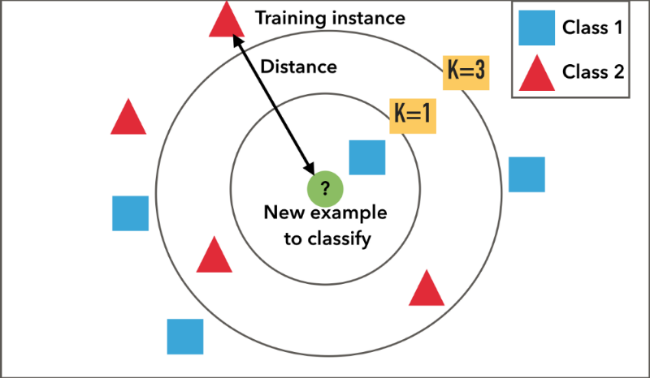

Importando o classificador **KNN**

In [244]:
from sklearn.neighbors import KNeighborsClassifier

**Implementando** o modelo e realizando as **predições**

In [245]:
#Criando o objeto do KNN
knn = KNeighborsClassifier(n_neighbors=5)

#"Treinando" o modelo KNN
knn.fit(X_train, y_train)

#Realizando as predições
knnpred = knn.predict(X_test)

**Avaliação** do modelo KNN

In [246]:
print("Relatório de Classificação\n\n",classification_report(y_test, knnpred))

Relatório de Classificação

               precision    recall  f1-score   support

           0       0.91      0.97      0.94     11967
           1       0.52      0.27      0.36      1597

    accuracy                           0.88     13564
   macro avg       0.71      0.62      0.65     13564
weighted avg       0.86      0.88      0.87     13564



In [247]:
print("Acurácia =",round(accuracy_score(y_test, knnpred),2)*100,"\n")

Acurácia = 88.0 



In [248]:
print("Matriz de Confusão\n\n",confusion_matrix(y_test, knnpred))

KNNCV = (cross_val_score(knn, X_train, y_train, cv=k_fold, n_jobs=1, scoring = 'accuracy').mean())

Matriz de Confusão

 [[11559   408]
 [ 1161   436]]


Podemos utilizar um loop no valor de K para avaliar onde o modelo terá uma erro menor

Obs.: Essa etapa pode consumir um pouco de tempo e processamento

In [249]:
error_rate = []

for i in range(1,20):
    
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train,y_train)
    pred_i = knn.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))

In [250]:
error_rate

[0.14951341787083455,
 0.11891772338543202,
 0.1242258920672368,
 0.11707460925980537,
 0.1156738425243291,
 0.11449424948392804,
 0.11316720731347685,
 0.11390445296372752,
 0.11449424948392804,
 0.1147891477440283,
 0.11353583013860218,
 0.11346210557357711,
 0.11161899144795046,
 0.11206133883810085,
 0.11102919492774993,
 0.11198761427307578,
 0.111102919492775,
 0.11125036862282513,
 0.11029194927749926]

Text(0, 0.5, 'Error Rate')

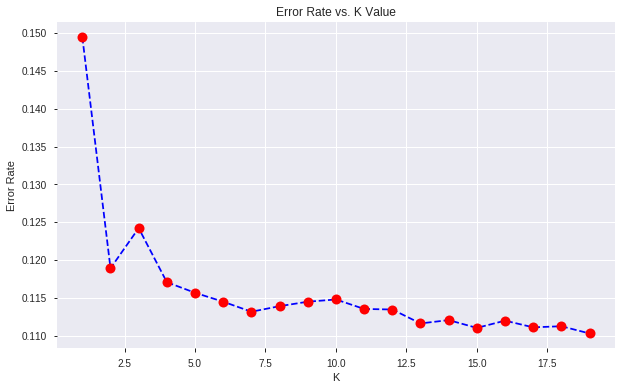

In [251]:
plt.figure(figsize=(10,6))
plt.plot(range(1,20),error_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

Conforme vemos acima, o gráfico nos mostra que a menor taixa de erro é para K= 20

Vamos realizar novamente a predição, porém com um novo valor em K

In [290]:
knn = KNeighborsClassifier(n_neighbors=7)

knn.fit(X_train,y_train)
pred = knn.predict(X_test)

**Nova avaliação** do modelo

In [291]:
print("Acurácia =",round(accuracy_score(y_test, knnpred),2)*100,"\n")

Acurácia = 88.0 



In [292]:
print("Matriz de Confusão\n\n",confusion_matrix(y_test, knnpred))

KNNCV = (cross_val_score(knn, X_train, y_train, cv=k_fold, n_jobs=1, scoring = 'accuracy').mean())

Matriz de Confusão

 [[11559   408]
 [ 1161   436]]


## Gradient Boosting

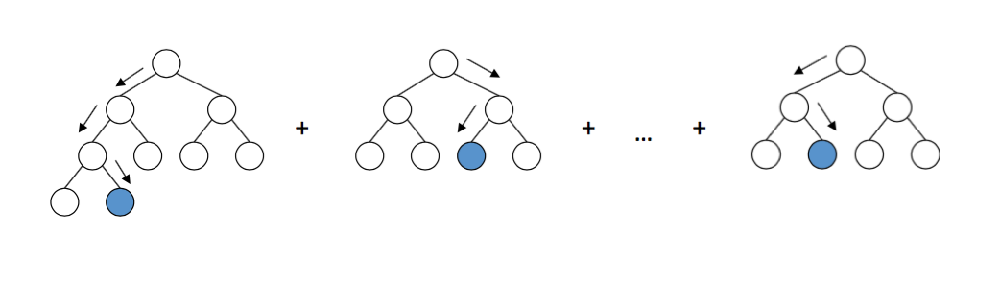

Importando o classificador do **Gradient Boosting**

In [256]:
from sklearn.ensemble import GradientBoostingClassifier

**Implementando** o modelo e realizando as **predições**

In [257]:
#Criando o objeto da classe
gbk = GradientBoostingClassifier()

#Treinamento do modelo
gbk.fit(X_train, y_train)

#Realizando as predições
gbkpred = gbk.predict(X_test)

**Avaliação** do modelo

In [258]:
print("Relatório de Classificação", classification_report(y_test, gbkpred))

Relatório de Classificação               precision    recall  f1-score   support

           0       0.92      0.98      0.95     11967
           1       0.69      0.40      0.51      1597

    accuracy                           0.91     13564
   macro avg       0.81      0.69      0.73     13564
weighted avg       0.90      0.91      0.90     13564



In [259]:
print("Matriz de Confusão\n\n",confusion_matrix(y_test, gbkpred ))

GBKCV = (cross_val_score(gbk, X_train, y_train, cv=k_fold, n_jobs=1, scoring = 'accuracy').mean())

Matriz de Confusão

 [[11678   289]
 [  952   645]]


In [260]:
print("Acurácia =",round(accuracy_score(y_test, gbkpred),2)*100)

Acurácia = 91.0


## SVM - Support Vector Machine

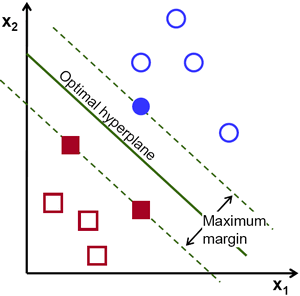

Importando o classificador do **Support Vector Machine**

In [261]:
from sklearn.svm import SVC

Repetindo os processos de transformação, porem para os dados menores, uma vez que o SVM tem alto consumo de recursos computacionais 

In [273]:
#Laço percorrendo todas as colunas e aplicando a transformação
for i in categorical_column:
    le = LabelEncoder()
    bank[i] = le.fit_transform(bank[i])

In [274]:
y_map = {'yes':1, 'no':0}

# Target = Somente a coluna 'y'
target_small = bank['y'].map(y_map)

# features = Todas as colunas, execeto a variável Target
features_small = bank.drop('y', axis=1)

In [275]:
X_train_small, X_test_small, y_train_small, y_test_small = train_test_split(features_small, target_small, test_size=0.30, random_state=101)

In [276]:
#Criando o objeto do SVM com os valores padrões
svc= SVC(gamma ='auto')

#Treinamento do modelo
svc.fit(X_train_small, y_train_small)

#Realizando as predições
svcpred = svc.predict(X_test_small)

**Avaliação** do modelo

In [277]:
print("Relatório de Classificação", classification_report(y_test_small, svcpred))

Relatório de Classificação               precision    recall  f1-score   support

           0       0.89      1.00      0.94      1202
           1       0.00      0.00      0.00       155

    accuracy                           0.89      1357
   macro avg       0.44      0.50      0.47      1357
weighted avg       0.78      0.89      0.83      1357



In [278]:
print("Matriz de Confusão",confusion_matrix(y_test_small, svcpred))

Matriz de Confusão [[1202    0]
 [ 155    0]]


In [279]:
print("Acurária =",round(accuracy_score(y_test_small, svcpred),2)*100)
SVCCV = (cross_val_score(svc, X_train_small, y_train_small, cv=k_fold, n_jobs=1, scoring = 'accuracy').mean())

Acurária = 89.0


### Gridsearch

Podemos utilizar o Gridsearch, função que permite testar diversas combinações de parâmetros nos nossos modelos, facilitando como achar os melhores parametros para otimizar o modelo.

Realizamos uma operação semelhante acima no modelo KNN, para encontrar o melhor valor de K, entretanto, isso pode ser um pouco menos eficiente que a utilização do GridSearch

Importando a classe **GridSearchCV**

In [280]:
from sklearn.model_selection import GridSearchCV

Definindo os parametros que serão variados no treino do modelo SVC

In [281]:
param_grid = {'C': [0.1,1, 10, 100, 1000], 'gamma': [1,0.1,0.01,0.001,0.0001], 'kernel': ['rbf']} 

**Implementando** o modelo

In [282]:
#Criando o objeto GridSearch
grid = GridSearchCV(SVC(),param_grid,refit=True,verbose=3)

#Treinando o modelo
grid.fit(X_train_small,y_train_small)

Fitting 3 folds for each of 25 candidates, totalling 75 fits
[CV] C=0.1, gamma=1, kernel=rbf ......................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.884, total=   0.3s
[CV] C=0.1, gamma=1, kernel=rbf ......................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.884, total=   0.3s
[CV] C=0.1, gamma=1, kernel=rbf ......................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.7s remaining:    0.0s


[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.884, total=   0.3s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.884, total=   0.3s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.884, total=   0.4s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.884, total=   0.4s
[CV] C=0.1, gamma=0.01, kernel=rbf ...................................
[CV] ....... C=0.1, gamma=0.01, kernel=rbf, score=0.884, total=   0.4s
[CV] C=0.1, gamma=0.01, kernel=rbf ...................................
[CV] ....... C=0.1, gamma=0.01, kernel=rbf, score=0.884, total=   0.4s
[CV] C=0.1, gamma=0.01, kernel=rbf ...................................
[CV] ....... C=0.1, gamma=0.01, kernel=rbf, score=0.884, total=   0.4s
[CV] C=0.1, gamma=0.001, kernel=rbf ..................................
[CV] .

[CV] ......... C=1000, gamma=1, kernel=rbf, score=0.884, total=   0.4s
[CV] C=1000, gamma=1, kernel=rbf .....................................
[CV] ......... C=1000, gamma=1, kernel=rbf, score=0.884, total=   0.4s
[CV] C=1000, gamma=1, kernel=rbf .....................................
[CV] ......... C=1000, gamma=1, kernel=rbf, score=0.884, total=   0.4s
[CV] C=1000, gamma=0.1, kernel=rbf ...................................
[CV] ....... C=1000, gamma=0.1, kernel=rbf, score=0.884, total=   0.4s
[CV] C=1000, gamma=0.1, kernel=rbf ...................................
[CV] ....... C=1000, gamma=0.1, kernel=rbf, score=0.884, total=   0.4s
[CV] C=1000, gamma=0.1, kernel=rbf ...................................
[CV] ....... C=1000, gamma=0.1, kernel=rbf, score=0.884, total=   0.4s
[CV] C=1000, gamma=0.01, kernel=rbf ..................................
[CV] ...... C=1000, gamma=0.01, kernel=rbf, score=0.884, total=   0.4s
[CV] C=1000, gamma=0.01, kernel=rbf ..................................
[CV] .

[Parallel(n_jobs=1)]: Done  75 out of  75 | elapsed:   27.6s finished


GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='auto_deprecated', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='warn', n_jobs=None,
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=3)

Verificando os parametros gerados pelo GridSearch

In [283]:
print("Melhores parametros:", grid.best_params_)
print("Melhor pontuação:", grid.best_score_)

Melhores parametros: {'C': 0.1, 'gamma': 1, 'kernel': 'rbf'}
Melhor pontuação: 0.8843236409608091


Realizando as **predições**

In [284]:
grid_predictions = grid.predict(X_test_small)

**Avaliando** o modelo

In [285]:
print("Matriz de Confusão\n", confusion_matrix(y_test_small,grid_predictions))

Matriz de Confusão
 [[1202    0]
 [ 155    0]]


In [286]:
print("Relatório de Classificação\n\n",classification_report(y_test_small,grid_predictions))

Relatório de Classificação

               precision    recall  f1-score   support

           0       0.89      1.00      0.94      1202
           1       0.00      0.00      0.00       155

    accuracy                           0.89      1357
   macro avg       0.44      0.50      0.47      1357
weighted avg       0.78      0.89      0.83      1357



### Avaliação de todos os Modelos

In [287]:
models = pd.DataFrame({
                'Modelos': ['SVM', 'KNN', 'GRADIENT BOOST'],
                'Pontuação':  [SVCCV, KNNCV, GBKCV]})

models.sort_values(by='Pontuação', ascending=False)

,Modelos,Pontuação
2,GRADIENT BOOST,0.903024
1,KNN,0.884949
0,SVM,0.884327


### Conclusão

De acordo com os resultados, o modelo com maior eficiência seria o **Gradient Boost**